# Non-Maximum Supression Validation


In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from plantclef.spark import get_spark

spark = get_spark(cores=4)
display(spark)

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
25/06/04 09:39:28 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
25/06/04 09:39:28 WARN SparkConf: Note that spark.local.dir will be overridden by the value set by the cluster manager (via SPARK_LOCAL_DIRS in mesos/standalone/kubernetes and LOCAL_DIRS in YARN).


In [3]:
import os
from pathlib import Path

# Get list of stored filed in cloud bucket
root = Path(os.path.expanduser("~"))
! date

Wed Jun  4 09:39:32 EDT 2025


### NMS detections

In [4]:
# Path and dataset names
data_path = f"{root}/p-dsgt_clef2025-0/shared/plantclef/data"
detect_path = f"{data_path}/detection/test_2025/test_2025_detection_v1"
detection_df = spark.read.parquet(detect_path)
detection_df.printSchema()
detection_df.show(n=5)

root
 |-- image_name: string (nullable = true)
 |-- output: struct (nullable = true)
 |    |-- extracted_bbox: array (nullable = true)
 |    |    |-- element: binary (containsNull = true)
 |    |-- boxes: array (nullable = true)
 |    |    |-- element: array (containsNull = true)
 |    |    |    |-- element: integer (containsNull = true)
 |    |-- scores: array (nullable = true)
 |    |    |-- element: float (containsNull = true)
 |    |-- text_labels: array (nullable = true)
 |    |    |-- element: string (containsNull = true)
 |-- sample_id: integer (nullable = true)



+--------------------+--------------------+---------+
|          image_name|              output|sample_id|
+--------------------+--------------------+---------+
|CBN-PdlC-D4-20160...|{[[89 50 4E 47 0D...|        0|
|CBN-Pla-A5-201407...|{[[89 50 4E 47 0D...|        0|
|CBN-PdlC-F4-20190...|{[[89 50 4E 47 0D...|        0|
|LISAH-BOU-0-167-2...|{[[89 50 4E 47 0D...|        0|
|CBN-Pla-A5-201409...|{[[89 50 4E 47 0D...|        0|
+--------------------+--------------------+---------+
only showing top 5 rows



In [5]:
detection_df.count()

2105

In [6]:
from pyspark.sql.functions import size, avg

avg_detections = (
    detection_df.select(size("output.extracted_bbox").alias("num_boxes"))
    .agg(avg("num_boxes"))
    .first()[0]
)
avg_detections

8.101187648456056

In [7]:
# Path and dataset names
test_path = f"{data_path}/parquet/test_2024"
test_df = spark.read.parquet(test_path)
test_df.printSchema()
test_df.show(n=5)

root
 |-- image_name: string (nullable = true)
 |-- path: string (nullable = true)
 |-- data: binary (nullable = true)



+--------------------+--------------------+--------------------+
|          image_name|                path|                data|
+--------------------+--------------------+--------------------+
|CBN-PdlC-C6-20130...|/test_2024/images...|[FF D8 FF E0 00 1...|
|CBN-Pla-D3-201508...|/test_2024/images...|[FF D8 FF E0 00 1...|
|CBN-PdlC-C3-20190...|/test_2024/images...|[FF D8 FF E0 00 1...|
|CBN-PdlC-C1-20200...|/test_2024/images...|[FF D8 FF E0 00 1...|
|CBN-PdlC-B2-20160...|/test_2024/images...|[FF D8 FF E0 00 1...|
+--------------------+--------------------+--------------------+
only showing top 5 rows



In [8]:
# join with test_df
joined_df = detection_df.join(test_df, on="image_name", how="inner")
joined_df.printSchema()
# get first imane name
# image_name = joined_df.select("image_name").first()[0]
image_name = "CBN-Pyr-03-20230706.jpg"
image_row = joined_df.filter(joined_df.image_name == image_name).collect()

root
 |-- image_name: string (nullable = true)
 |-- output: struct (nullable = true)
 |    |-- extracted_bbox: array (nullable = true)
 |    |    |-- element: binary (containsNull = true)
 |    |-- boxes: array (nullable = true)
 |    |    |-- element: array (containsNull = true)
 |    |    |    |-- element: integer (containsNull = true)
 |    |-- scores: array (nullable = true)
 |    |    |-- element: float (containsNull = true)
 |    |-- text_labels: array (nullable = true)
 |    |    |-- element: string (containsNull = true)
 |-- sample_id: integer (nullable = true)
 |-- path: string (nullable = true)
 |-- data: binary (nullable = true)



In [9]:
display(image_name)

'CBN-Pyr-03-20230706.jpg'

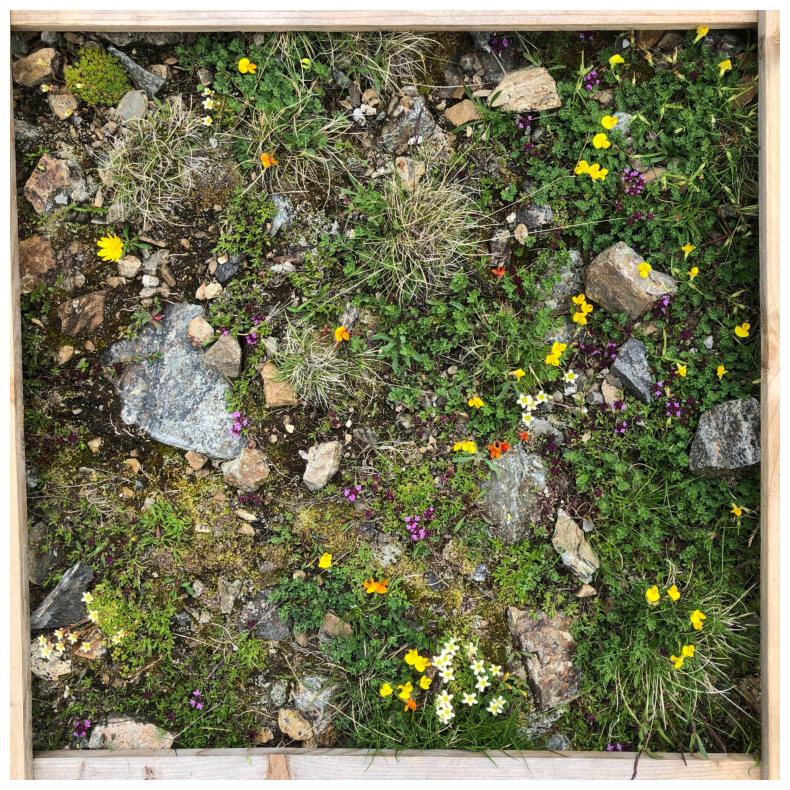

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from plantclef.serde import deserialize_image


# extract image
img_bytes = image_row[0]["data"]
np_arr = np.frombuffer(img_bytes, np.uint8)
img = deserialize_image(img_bytes)  # Pillow image

# plot Pillow image
plt.figure(figsize=(10, 10))
plt.imshow(img)  # img_rgb
plt.axis("off")
plt.show()

In [11]:
import matplotlib.patches as patches


def plot_detections(image, detections):
    # assign colors to labels
    unique_labels = list(set(detections["text_labels"]))
    cmap = plt.get_cmap("tab10", len(unique_labels))
    label_to_color = {label: cmap(i) for i, label in enumerate(unique_labels)}

    # create a figure
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(image)  # Pillow image

    # loop through detections and draw boxes with corresponding label colors
    for box, label, score in zip(
        detections["boxes"], detections["text_labels"], detections["scores"]
    ):
        x_min, y_min, x_max, y_max = box
        color = label_to_color[label]

        # create a rectangle patch
        rect = patches.Rectangle(
            (x_min, y_min),
            x_max - x_min,
            y_max - y_min,
            linewidth=2,
            edgecolor=color,
            facecolor="none",
        )
        ax.add_patch(rect)

        # add label text
        ax.text(
            x_min,
            y_min - 5,
            f"{label} {score:.2f}",
            fontsize=12,
            color="white",
            bbox=dict(facecolor=color, edgecolor="none", pad=2.0),
        )

    plt.axis("off")
    plt.tight_layout()
    plt.show()

In [12]:
detections = {
    "boxes": image_row[0]["output"]["boxes"],
    "text_labels": image_row[0]["output"]["text_labels"],
    "scores": image_row[0]["output"]["scores"],
}

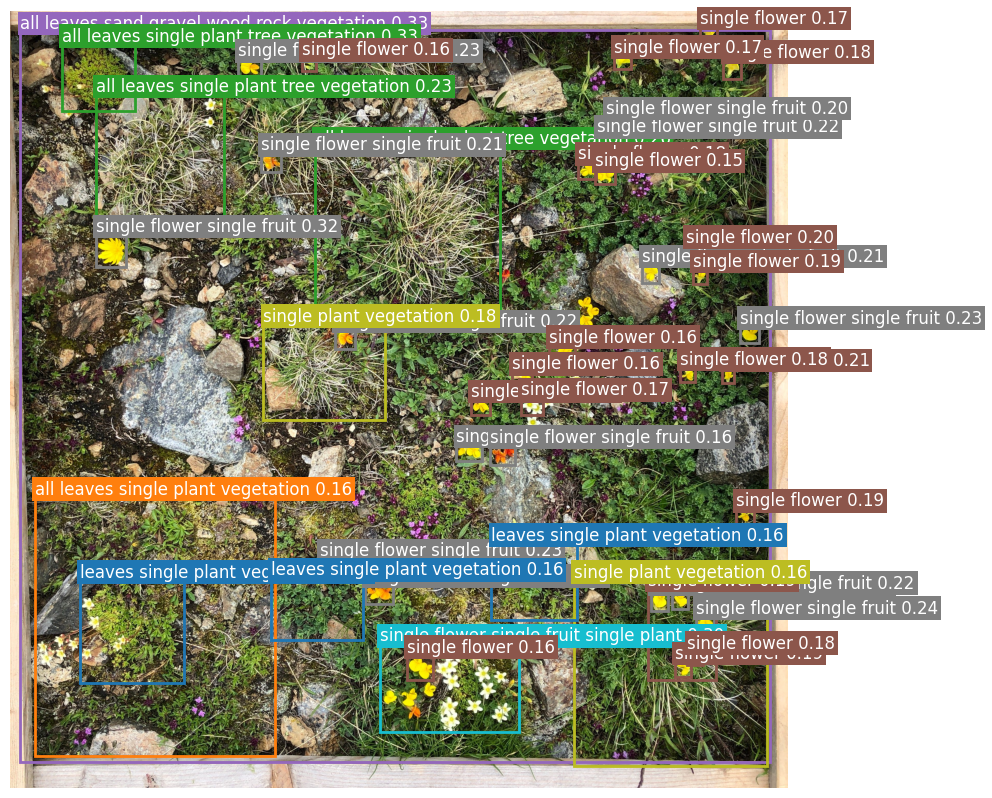

In [13]:
plot_detections(image=img, detections=detections)

In [14]:
len(detections["boxes"]), len(detections["text_labels"]), len(detections["scores"])

(45, 45, 45)

In [15]:
detections["text_labels"]

['all leaves sand gravel wood rock vegetation',
 'all leaves single plant tree vegetation',
 'single flower single fruit',
 'single flower single fruit single plant',
 'all leaves single plant tree vegetation',
 'single flower single fruit',
 'single flower single fruit',
 'single flower single fruit',
 'single flower single fruit',
 'single flower single fruit',
 'single flower single fruit',
 'all leaves single plant tree vegetation',
 'single flower single fruit',
 'single flower single fruit',
 'single flower single fruit',
 'single flower single fruit',
 'single flower single fruit',
 'single flower',
 'single flower single fruit',
 'single flower single fruit',
 'single flower',
 'single flower',
 'leaves single plant vegetation',
 'single flower',
 'single flower',
 'single flower',
 'single flower',
 'single flower',
 'single flower',
 'single flower',
 'single flower',
 'single plant vegetation',
 'single flower',
 'single flower',
 'single flower',
 'single flower single frui

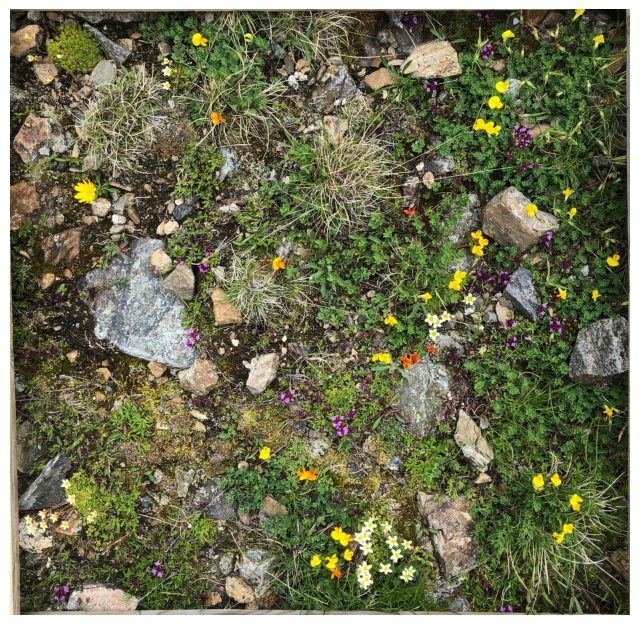

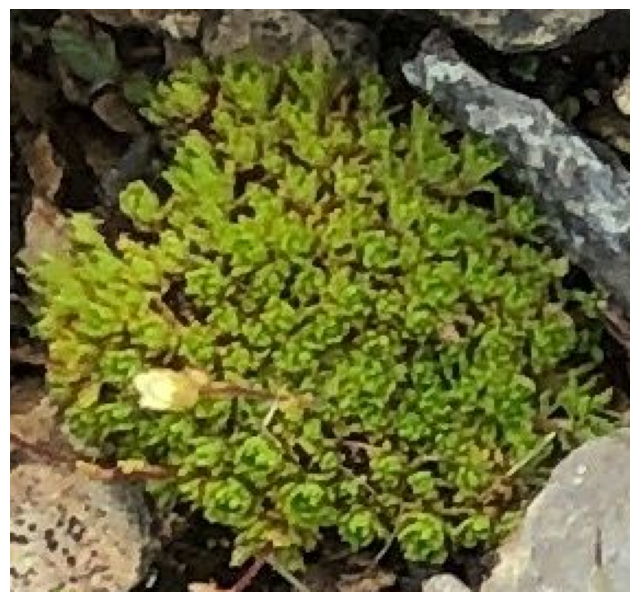

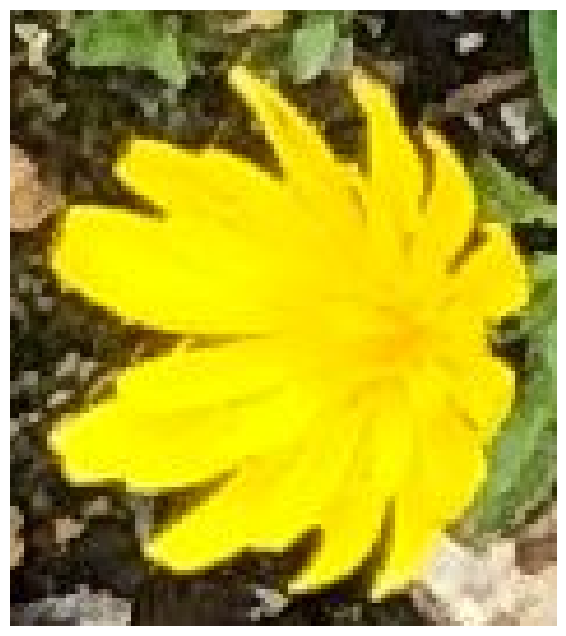

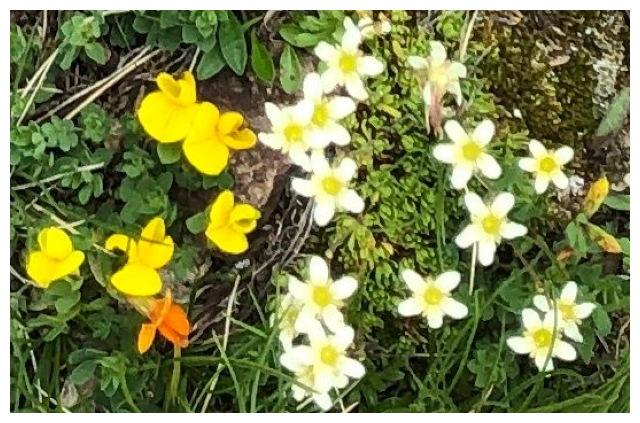

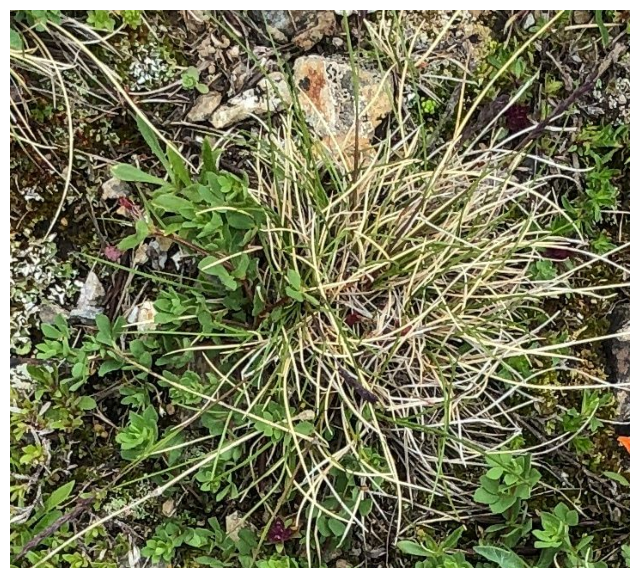

...

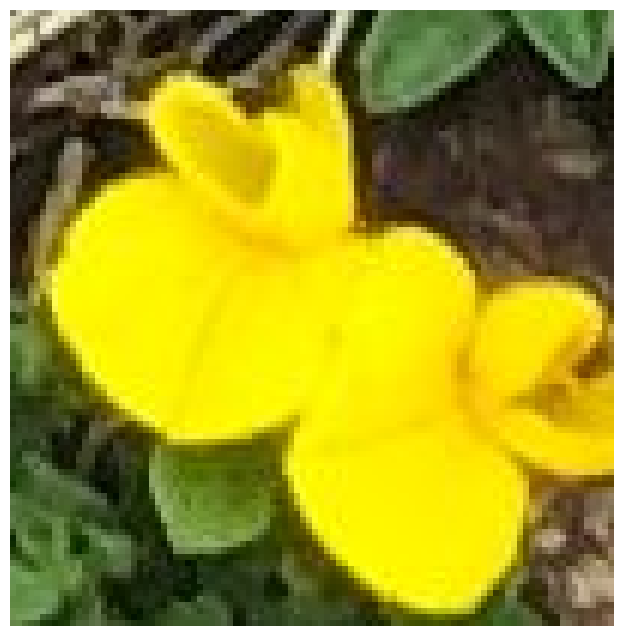

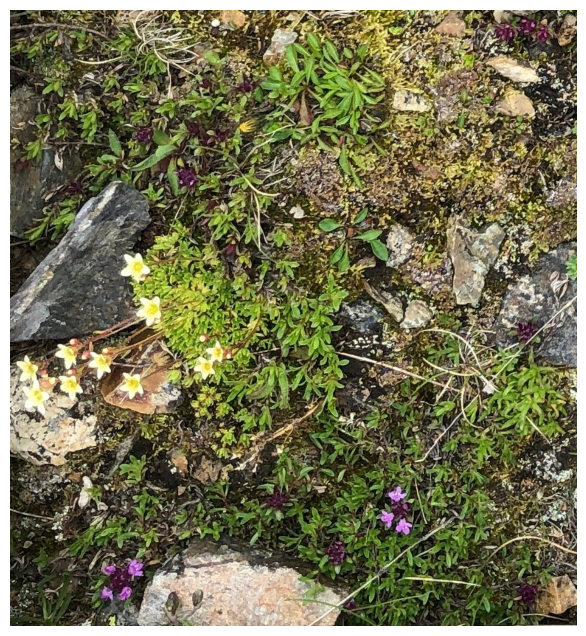

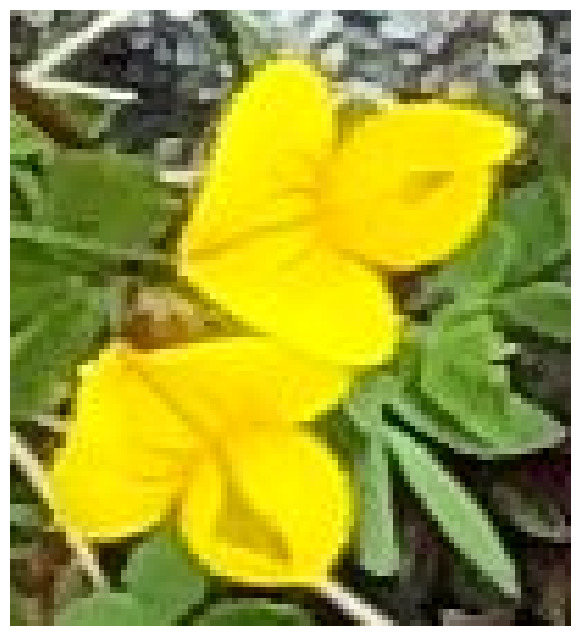

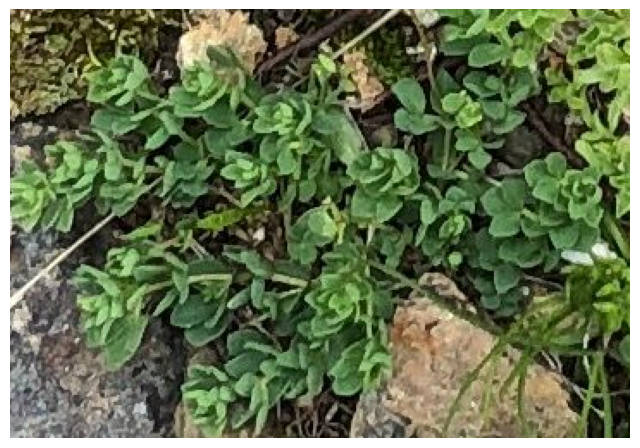

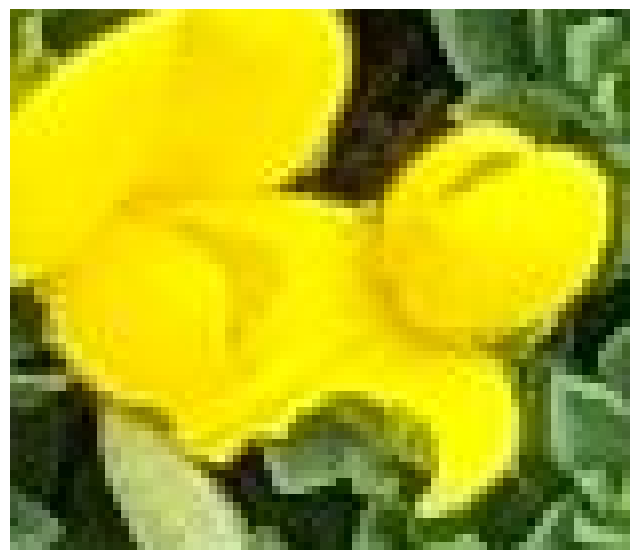

In [16]:
from plantclef.serde import deserialize_image

bboxes = image_row[0]["output"]["extracted_bbox"]
for i in range(len(bboxes)):
    bbox = bboxes[i]
    img_bbox = deserialize_image(bbox)
    # plot Pillow image
    plt.figure(figsize=(8, 8))
    plt.imshow(img_bbox)  # img_rgb
    plt.axis("off")
    plt.show()

In [55]:
import textwrap
from plantclef.plotting import crop_image_square


def plot_bboxes_grid(
    bboxes,
    labels=None,
    grid_size=(3, 3),
    crop_square: bool = False,
    figsize: tuple = (12, 12),
    dpi: int = 80,
):
    """
    Plot a grid of bounding box tiles (binary data) using matplotlib.

    :param bboxes: List of binary image data representing extracted bounding boxes.
    :param labels: Optional list of labels (e.g., predicted species or coordinates) for each image.
    :param grid_size: Tuple (rows, cols) specifying the layout of the plot.
    :param crop_square: Boolean to crop images to a center square.
    :param figsize: Figure size (width, height) in inches.
    :param dpi: Resolution of the plot in dots per inch.
    """
    rows, cols = grid_size
    total = rows * cols

    # Trim or pad bboxes list to match the grid
    bboxes = bboxes[1 : total + 1]
    if labels:
        labels = labels[:total]
    else:
        labels = [""] * len(bboxes)

    fig, axes = plt.subplots(rows, cols, figsize=figsize, dpi=dpi)
    axes = axes.flatten() if isinstance(axes, np.ndarray) else [axes]

    for i, (ax, bbox_data, label) in enumerate(zip(axes, bboxes, labels)):
        img = deserialize_image(bbox_data)
        if crop_square:
            img = crop_image_square(img)
        ax.imshow(img)
        wrapped_label = "\n".join(textwrap.wrap(label.replace("_", " "), width=25))
        ax.set_title(wrapped_label, fontsize=12, pad=5)

        ax.set_xlabel(f"BBox {i + 1}", fontsize=24)  # Set label before disabling ticks
        ax.tick_params(
            left=False, bottom=False, labelleft=False, labelbottom=False
        )  # Keep x-label
        for spine in ax.spines.values():
            spine.set_visible(False)

    plt.tight_layout()
    plt.subplots_adjust(top=0.90)
    path = Path(os.getcwd()).parents[1]
    plt.savefig(
        f"{path}/figures/detection-tiles.png", bbox_inches="tight", transparent=True
    )
    plt.show()

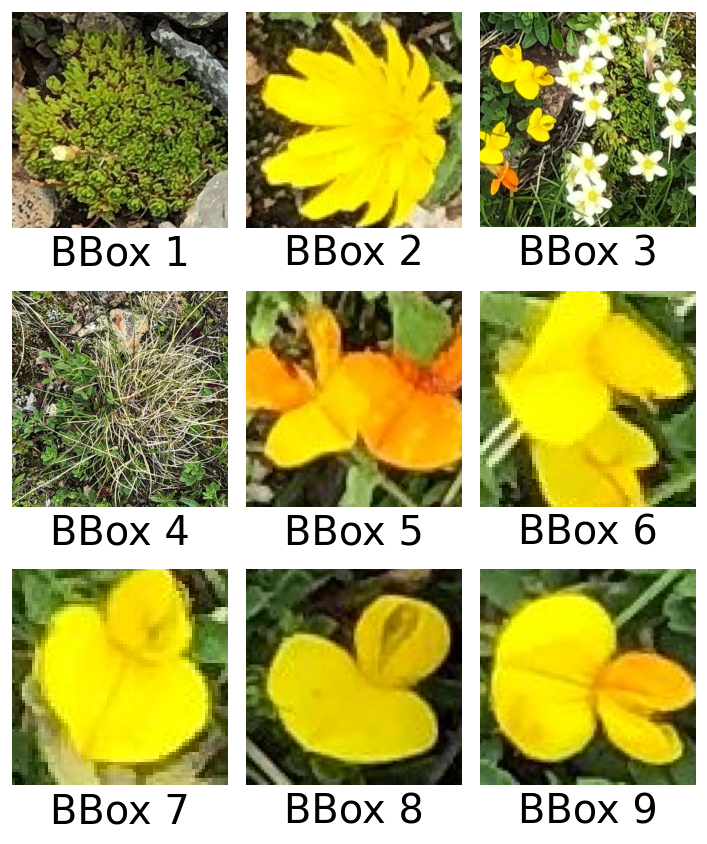

In [56]:
bboxes = image_row[0]["output"]["extracted_bbox"]
plot_bboxes_grid(
    bboxes,
    crop_square=True,
    grid_size=(3, 3),
    figsize=(6, 8),
    dpi=120,
)